# CMIP6 datacubes short tutorial

Here we illustrate how to interact with the cmip6 api via datamesh and the series of datacubes that have been registered with it.
We do it all programatically but ultimately the data connection is possible to configure via the datamesh web interface.
We connect to datamesh using an account that has access to the datacubes

In [1]:
import dotenv
dotenv.load_dotenv("/home/sebastien/.env/.datamesh")

True

In [4]:
from oceanum.datamesh import Connector
from matplotlib import pyplot as plt
import xarray as xr
import numpy as np
import os

datamesh = Connector(service="https://datamesh.oceanum.io",
                     token=os.getenv("OCEANUM_USER_IO_TOKEN"))

When using the python only the datacubes should be searchable using the tags but for convenience we use the datasource_id which we know starts with `cmip6_datacube`. As seen below there are a few datacubes available with each datacube corresponding to a realm (atmosphere, ocean or sea ice), an output frequency (monthly, daily, 3 hourly and an experiment (either historical either one of the future projection scenario). The ID of those datacubes should make it relatively easy to guess what data they contain.
The data we are offering is redistributed from the subset of the cmip6 data that is hosted in google cloud storage (large amount of data but far from being the full amount).
Assuming that the first purpose of the datacubes is to explore climate data within the context of an ensemble of data, we have put together datacube configurations that aim at offering access to a subset of the data available on google cloud storage. Variable coverage for different model runs and output frequency is very uneven accross the google archive and hence the datacubes subsets aim represent the largest number of model runs possible for which a large portion of the selected variables are effectively available. In general this should be enough to allow either to look at the data either in the context of multiple realisation of the same model or that of a multi-model ensemble. Model and ensemble selection is likely to be application/location dependent and we aim at offering a variety of selection option rather than suggesting any model/model realisation should be used rather another.

In [6]:
sorted([did for did in datamesh.get_catalog().ids if "cmip6_datacube" in did])

['cmip6_datacube_3hourly_atmospheric_historical',
 'cmip6_datacube_3hourly_atmospheric_ssp126',
 'cmip6_datacube_3hourly_atmospheric_ssp245',
 'cmip6_datacube_3hourly_atmospheric_ssp370',
 'cmip6_datacube_3hourly_atmospheric_ssp585',
 'cmip6_datacube_daily_atmospheric_historical',
 'cmip6_datacube_daily_atmospheric_ssp126',
 'cmip6_datacube_daily_atmospheric_ssp245',
 'cmip6_datacube_daily_atmospheric_ssp370',
 'cmip6_datacube_daily_atmospheric_ssp585',
 'cmip6_datacube_daily_oceanic_historical',
 'cmip6_datacube_daily_oceanic_ssp126',
 'cmip6_datacube_daily_oceanic_ssp245',
 'cmip6_datacube_daily_oceanic_ssp370',
 'cmip6_datacube_daily_oceanic_ssp585',
 'cmip6_datacube_monthly_atmospheric_historical',
 'cmip6_datacube_monthly_atmospheric_ssp126',
 'cmip6_datacube_monthly_atmospheric_ssp245',
 'cmip6_datacube_monthly_atmospheric_ssp370',
 'cmip6_datacube_monthly_atmospheric_ssp585',
 'cmip6_datacube_monthly_ocean_historical',
 'cmip6_datacube_monthly_oceanic_ssp126',
 'cmip6_datacube_m

Let's work with monthly atmospheric data for now, the following datacube are available:
- 'cmip6_datacube_monthly_atmospheric_historical'
- 'cmip6_datacube_monthly_atmospheric_ssp126'
- 'cmip6_datacube_monthly_atmospheric_ssp245'
- 'cmip6_datacube_monthly_atmospheric_ssp370'
- 'cmip6_datacube_monthly_atmospheric_ssp585'

The historical datacube contains data from 1850 to 2015 that allow to access how well the model represented historical climate data and have data for a known reference period.
The ssp datacubes are future projections correcponding to four of the cmip6 emission scenarios and cover the 2015 to 2101 period.
More senarios exists as part of CMIP6 and could potentially be added to the datamesh catalog. The present selection correspond to the scenarios for which the most data is available.

In [3]:
datamesh.get_datasource("cmip6_datacube_monthly_atmospheric_historical")


        CMIP6 historical monthly atmospheric interpolated datacube [cmip6_datacube_monthly_atmospheric_historical]
            Extent: (-180.0, -90.0, 360.0, 90.0)
            Timerange: 1850-01-01 00:00:00+00:00 to 2015-01-01 00:00:00+00:00
            0 attributes
            10 variables
        

In [15]:
datamesh.get_datasource("cmip6_datacube_monthly_atmospheric_ssp126")


        CMIP6 ssp126 monthly atmospheric interpolated datacube [cmip6_datacube_monthly_atmospheric_ssp126]
            Extent: (-180.0, -90.0, 360.0, 90.0)
            Timerange: 2015-01-01 00:00:00+00:00 to 2101-01-01 00:00:00+00:00
            0 attributes
            11 variables
        

Now we can connection to one of the datacubes using the load_datasource function.
The first connection to a datacube can take a few minutes as the backend service automatically shuts down when not in use and it takes a few minutes to provision a new machine and start the service.
The datacube is returned in the shape of a xarray dataset.
The dimensions of the dataset variables are cube_member_id, time, lat, lon where:
- cube_member_id corresponds to a specific realisation of a given model. In cmip6 terminology this would refer to a specific combination of organisation_id, source_id and member_id.
- time is the time dimension
- lat and lon are the longitude and latitude of the virtual grid the datacube is configured with. Because all models have different native grid, the only way to offer data as a consistent cube is to regrid it to a common grid. We arbitrarily selected a 1 degree grid and a bilinear interpolation scheme.
Besides those dimensions some variables are available in the datacube solely for the purpose of data selection:
- organisation_id contains the cmip6 organisation_id value of the datacube members
- source_id contains the cmip6 source_id value of the datacube members
- member_id contains the cmip6 member_id value of the datacube members
- member_index is an integer that aims at indexing members for a given organisation_id/source_id combination. For a given organisation_id/source_id, the realisations available in the cube are number starting with r1i1p1f1 if available and realisations are ordered using 'r' as the fatest index then consecutively 'i', 'p' and 'f'.
- variable_available is a variable that contains a table of booleans describing whether a source is available for a given (cube_member/variable pair).
All the other variables are physical cmip6 variables and should have a standard name and a long name as part of their attributes.


In [5]:
ds = datamesh.load_datasource("cmip6_datacube_monthly_atmospheric_ssp126")
ds 

/home/sebastien/.env/datamesh/lib/python3.11/site-packages/gribapi/__init__.py:23: UserWarning: ecCodes 2.31.0 or higher is recommended. You are running version 2.30.0
  warnings.warn(


<xarray.Dataset> Size: 909GB
Dimensions:             (cube_member_id: 225, time: 1032, lat: 181, lon: 541,
                         variable_id: 10)
Coordinates:
  * cube_member_id      (cube_member_id) <U45 40kB 'BCC_BCC-CSM2-MR_r1i1p1f1'...
  * lat                 (lat) int64 1kB -90 -89 -88 -87 -86 ... 86 87 88 89 90
  * lon                 (lon) int64 4kB -180 -179 -178 -177 ... 357 358 359 360
    spatial_ref         int64 8B ...
  * time                (time) datetime64[ns] 8kB 2015-01-16T12:00:00 ... 210...
  * variable_id         (variable_id) <U10 400B 'tas' 'huss' ... 'sfcWindmax'
Data variables: (12/15)
    huss                (cube_member_id, time, lat, lon) float32 91GB dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    institution_id      (cube_member_id) <U19 17kB dask.array<chunksize=(225,), meta=np.ndarray>
    member_id           (cube_member_id) <U9 8kB dask.array<chunksize=(225,), meta=np.ndarray>
    member_index        (cube_member_id) int64 2kB dask.array<chunksize=(225,), meta=np.ndarray>
    pr                  (cube_member_id, time, lat, lon) float32 91GB dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    psl                 (cube_member_id, time, lat, lon) float32 91GB dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    ...                  ...
    tas                 (cube_member_id, time, lat, lon) float32 91GB dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    tasmax              (cube_member_id, time, lat, lon) float32 91GB dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    tasmin              (cube_member_id, time, lat, lon) float32 91GB dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    uas                 (cube_member_id, time, lat, lon) float32 91GB dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    variable_available  (cube_member_id, variable_id) bool 2kB dask.array<chunksize=(225, 10), meta=np.ndarray>
    vas                 (cube_member_id, time, lat, lon) float32 91GB dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>

Now that we have connected to the datacube, let's look at the data that is available. For that, we load and plot the variable_available table. As we can see most of the datacube members have all the variables available but nevertheless a few are missing minimum and maximum temperature and some are missing the u/v components of wind or the surface humidity.

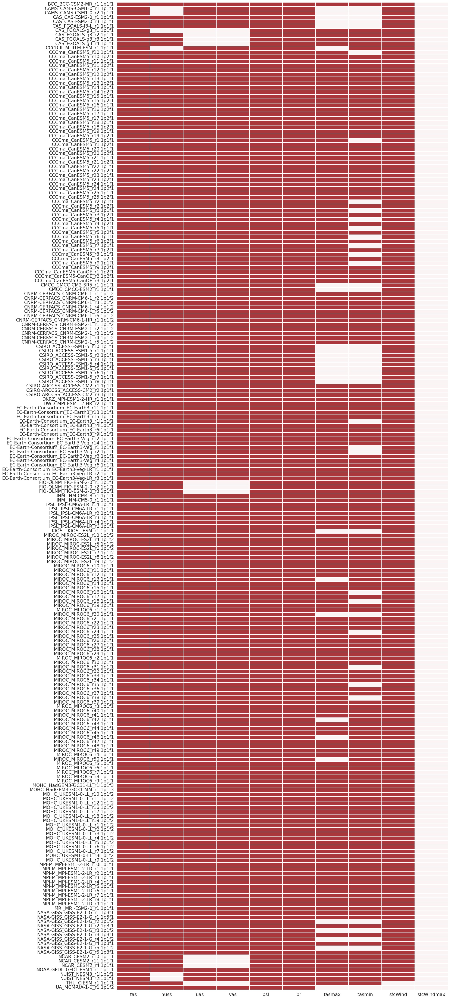

In [6]:
import seaborn as sn
import pandas as pd

dd = pd.DataFrame(ds.variable_available.values,
                  ds.cube_member_id.values,
                  ds.variable_id.values)
dd

plt.figure(figsize=(20,60))
sn.set(font_scale=1.4) # for label size
sn.heatmap(dd,
           cmap="vlag",
           vmin=-1,
              vmax=1,
           linewidth=1,
           yticklabels=1,
           cbar=False,
           ) # font size

plt.show()

# Timeseries data example
Let's now pull some data from the datacube. Here, we will do the same operations twice, once using the xarray interface and once using the datamesh query interface. While the xarray interface can be convenient as familliar to many oceanographers, it is not necessarily the best/most efficient way to pull data out of datamesh. This mostly relates to the fact that the service that backs the xarray datasets has no way to know the data requests users are making as a whole (timeseries vs grid for example) as xarray breaks down data requests into multiple separate small data requests (one per data chunk retrieved). While the size of those chunks is preconfigured, this results in suboptimal data access patterns which in some extreme cases can results in massive data volume being downloaded or large compute overheads and potentially no data coming out of the API. Hence, we recommand to do as much filtering as practical using the datamesh query interface. At the end you will still get handed a xarray object that you will be able to manipulate to do your analysis.

Here, we want to download timeseries of surface temperature for all the sources available for the institution EC-Earth-Consortium. We start by filtering the datacube using isel which gives us a lazy filtered dataset. Then instead of loading the data into memory we write it to disk in zarr format.

In [7]:
ds.isel(cube_member_id=(ds.institution_id.values=="EC-Earth-Consortium"))

<xarray.Dataset>
Dimensions:             (cube_member_id: 17, time: 1032, lat: 181, lon: 541,
                         variable_id: 10)
Coordinates:
  * cube_member_id      (cube_member_id) <U45 'EC-Earth-Consortium_EC-Earth3_...
  * lat                 (lat) int64 -90 -89 -88 -87 -86 -85 ... 86 87 88 89 90
  * lon                 (lon) int64 -180 -179 -178 -177 -176 ... 357 358 359 360
    spatial_ref         int64 ...
  * time                (time) datetime64[ns] 2015-01-16T12:00:00 ... 2100-12...
  * variable_id         (variable_id) <U10 'tas' 'huss' ... 'sfcWindmax'
Data variables: (12/15)
    huss                (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    institution_id      (cube_member_id) <U19 dask.array<chunksize=(17,), meta=np.ndarray>
    member_id           (cube_member_id) <U9 dask.array<chunksize=(17,), meta=np.ndarray>
    member_index        (cube_member_id) int64 dask.array<chunksize=(17,), meta=np.ndarray>
    pr                  (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    psl                 (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    ...                  ...
    tas                 (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    tasmax              (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    tasmin              (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    uas                 (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>
    variable_available  (cube_member_id, variable_id) bool dask.array<chunksize=(17, 10), meta=np.ndarray>
    vas                 (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1032, 5, 5), meta=np.ndarray>

In [8]:
ds.isel(cube_member_id=(ds.institution_id.values=="EC-Earth-Consortium"))[['tas', 'source_id']].isel(lon=100, lat=90).to_zarr('/tmp/tas.zarr', mode='w', compute=True)

Now the data has been downloaded locally, we open the local zarr archive to access the data. As expected the dataset contains surface temparture data for the expected sources.

In [9]:
data = xr.open_zarr('/tmp/tas.zarr/')
data.tas.values

array([[296.97815, 297.1525 , 297.33676, ..., 297.60605, 297.46942,
        297.61734],
       [297.82227, 297.91498, 298.09656, ..., 298.25012, 298.0043 ,
        298.09113],
       [297.6568 , 297.97406, 298.02975, ..., 297.7914 , 298.0095 ,
        298.12064],
       ...,
       [296.27475, 296.5288 , 296.6556 , ..., 296.08163, 295.97964,
        295.94327],
       [295.23712, 295.79565, 295.61014, ..., 296.64847, 296.21445,
        296.66043],
       [295.63037, 295.61362, 296.13257, ..., 296.34747, 296.00266,
        296.40433]], dtype=float32)

In [10]:
data.source_id.values

array(['EC-Earth3', 'EC-Earth3', 'EC-Earth3', 'EC-Earth3', 'EC-Earth3',
       'EC-Earth3', 'EC-Earth3', 'EC-Earth3-Veg', 'EC-Earth3-Veg',
       'EC-Earth3-Veg', 'EC-Earth3-Veg', 'EC-Earth3-Veg', 'EC-Earth3-Veg',
       'EC-Earth3-Veg', 'EC-Earth3-Veg-LR', 'EC-Earth3-Veg-LR',
       'EC-Earth3-Veg-LR'], dtype='<U16')

We can use it to generate a plot that shows the evolution of the surface temperature between 2030 and 2040 for each source. For each source we show the mean, minimum and maximum temperature defined as the average, minimum and maximum at each point in time between all realisations available for a given source. We can see that at this location the blue and orange models are in close agreement while the green model is quite a bit colder.

(21915.0, 25567.0)

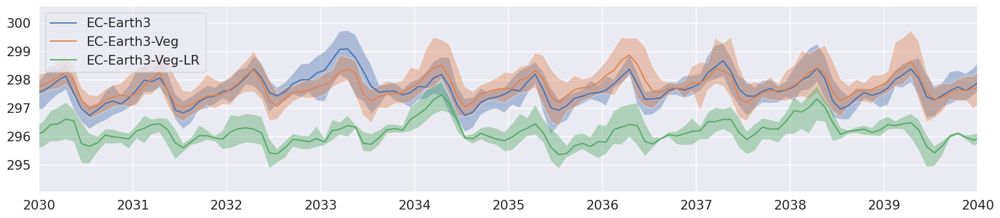

In [11]:
plt.figure(figsize=(20,4))
for source_id in np.unique(data.source_id.values):
    plt.plot(data.time.values, data.tas.isel(cube_member_id=(data.source_id.values==source_id)).mean(dim='cube_member_id').values, label=source_id)
    plt.fill_between(data.time.values,
                     data.tas.isel(cube_member_id=(data.source_id.values==source_id)).min(dim='cube_member_id').values,
                     data.tas.isel(cube_member_id=(data.source_id.values==source_id)).max(dim='cube_member_id').values,
                     alpha=0.4)
plt.legend()
plt.xlim(xmin=np.datetime64("2030-01-01T00:00:00"),
         xmax=np.datetime64("2040-01-01T00:00:00"))

Now we use the datamesh query interface. Appart for the syntax and what is happening in the backend, the main difference is that in the case of a point query we can specify our own longitude/latitude rather than select one node of the grid. Here we use the same longitude/latitudes as previously and reassuringly get the same plot as a result.

In [10]:
query_ds = datamesh.query({
  "datasource": "cmip6_datacube_monthly_atmospheric_ssp126",
  "parameters": {},
  "description": "Test query",
  "variables": [
    "tas"
  ],
  "geofilter": {
    "type": "feature",
            "geom": {
                "type": "Feature",
                "geometry": {
                    "type": "Point",
                    "coordinates": [-80, 0]
                },
            },
  },
  "coordfilter": [{"coord": "institution_id", "values": ["EC-Earth-Consortium"]}],
},
use_dask=True)
query_ds

<xarray.Dataset>
Dimensions:         (cube_member_id: 17, time: 1032)
Coordinates:
  * cube_member_id  (cube_member_id) <U45 'EC-Earth-Consortium_EC-Earth3_r11i...
    spatial_ref     int64 ...
  * time            (time) datetime64[ns] 2015-01-16T12:00:00 ... 2100-12-16T...
Data variables:
    institution_id  (cube_member_id) <U19 dask.array<chunksize=(17,), meta=np.ndarray>
    member_id       (cube_member_id) <U9 dask.array<chunksize=(17,), meta=np.ndarray>
    member_index    (cube_member_id) int64 dask.array<chunksize=(17,), meta=np.ndarray>
    source_id       (cube_member_id) <U16 dask.array<chunksize=(17,), meta=np.ndarray>
    tas             (cube_member_id, time) float32 dask.array<chunksize=(1, 1032), meta=np.ndarray>

In [11]:
query_ds.to_zarr('/tmp/query_tas.zarr', mode='w')
data = xr.open_zarr('/tmp/query_tas.zarr/')

(21915.0, 25567.0)

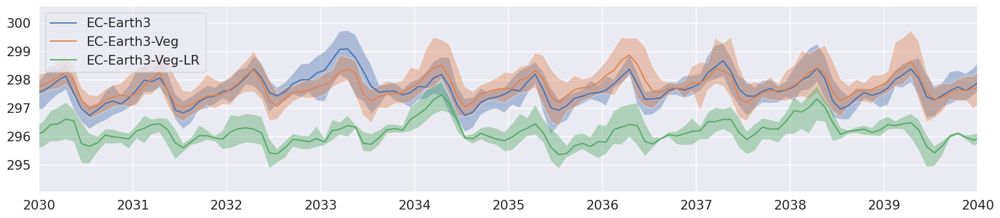

In [14]:
plt.figure(figsize=(20,4))
for source_id in np.unique(data.source_id.values):
    plt.plot(data.time.values, data.tas.isel(cube_member_id=(data.source_id.values==source_id)).mean(dim='cube_member_id').values, label=source_id)
    plt.fill_between(data.time.values,
                     data.tas.isel(cube_member_id=(data.source_id.values==source_id)).min(dim='cube_member_id').values,
                     data.tas.isel(cube_member_id=(data.source_id.values==source_id)).max(dim='cube_member_id').values,
                     alpha=0.4)
plt.legend()
plt.xlim(xmin=np.datetime64("2030-01-01T00:00:00"),
         xmax=np.datetime64("2040-01-01T00:00:00"))

If we want interpolated data at multiple location, we can request it in a single query by using a MultiPoint geometry as illustrated below.

In [9]:
query_ds2 = datamesh.query({
  "datasource": "cmip6_datacube_monthly_atmospheric_ssp126",
  "parameters": {},
  "description": "Test query",
  "variables": [
    "tas"
  ],
  "geofilter": {
    "type": "feature",
            "geom": {
                "type": "Feature",
                "geometry": {
                    "type": "MultiPoint",
                    "coordinates": [
                        [-80, 0],
                        [165, -48],
                        [165, 48],
                    ]
                },
            },
  },
  "coordfilter": [{"coord": "institution_id", "values": ["EC-Earth-Consortium"]}],
},
use_dask=True)
query_ds2

<xarray.Dataset>
Dimensions:         (cube_member_id: 17, time: 1032, location: 3)
Coordinates:
  * cube_member_id  (cube_member_id) <U45 'EC-Earth-Consortium_EC-Earth3_r11i...
    spatial_ref     int64 ...
  * time            (time) datetime64[ns] 2015-01-16T12:00:00 ... 2100-12-16T...
Dimensions without coordinates: location
Data variables:
    institution_id  (cube_member_id) <U19 dask.array<chunksize=(17,), meta=np.ndarray>
    member_id       (cube_member_id) <U9 dask.array<chunksize=(17,), meta=np.ndarray>
    member_index    (cube_member_id) int64 dask.array<chunksize=(17,), meta=np.ndarray>
    source_id       (cube_member_id) <U16 dask.array<chunksize=(17,), meta=np.ndarray>
    tas             (cube_member_id, time, location) float32 dask.array<chunksize=(1, 1032, 1), meta=np.ndarray>

In [16]:
query_ds2.to_zarr('/tmp/query_tas2.zarr', mode='w')
data = xr.open_zarr('/tmp/query_tas2.zarr/')

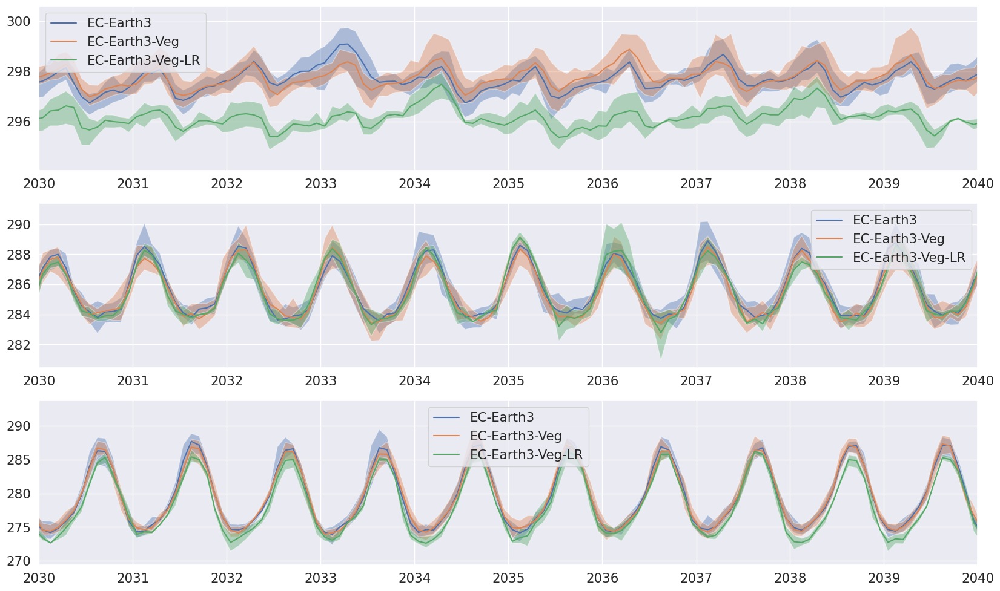

In [17]:
fig, axes = plt.subplots(figsize=(20,4*3), nrows=3)
for il, location in enumerate(data.location.values):
    for source_id in np.unique(data.source_id.values):
        axes[il].plot(data.time.values,
                      data.tas.isel(cube_member_id=(data.source_id.values==source_id),
                                    location=il).mean(dim='cube_member_id').values, label=source_id)
        axes[il].fill_between(data.time.values,
                        data.tas.isel(cube_member_id=(data.source_id.values==source_id),
                                     location=il).min(dim='cube_member_id').values,
                        data.tas.isel(cube_member_id=(data.source_id.values==source_id),
                                     location=il).max(dim='cube_member_id').values,
                        alpha=0.4)
    axes[il].legend()
    axes[il].set_xlim(xmin=np.datetime64("2030-01-01T00:00:00"),
                      xmax=np.datetime64("2040-01-01T00:00:00"))

# Gridded data example

Now we want get global gridded data for the minumum and maximum monthly temperature for a given year and month.
We only want to retrieve data for those models that have the variable we are interested in.
We first use the `variable_available` table to find the models that have the variable we want and then we retrieve the data.
In theory we could use the xarray interface, however, it has been optimised for timeseries time requests and hence would take very long to retrieve gridded data at the scale of the planet (even a single frame).
The query interface is such that point/multipoint queries get optimised for timeseries queries and bounding box queries get optimised for grid queries. Note that if no geofilter is used in the query the data service uses the default configuration which is that used by xarray and therefore timeseries optimised. Here, we will use a geofilter that is a bounding box around the whole world for the sake of query optimisation rather than geofiltering.

In [13]:
# We identify the members that have both tasmin and tasmax
selected =\
    np.logical_and(ds.variable_available.sel(variable_id="tasmin").values,
                   ds.variable_available.sel(variable_id="tasmax").values)
selected_member_ids=ds.cube_member_id.values[selected]

In [14]:
# We query the datacube for tasmin and tasmax and ask for a lazy dataset back (use_dask=True)
query_ds3 = datamesh.query({
  "datasource": "cmip6_datacube_monthly_atmospheric_ssp126",
  "parameters": {},
  "description": "Test query",
  "variables": [
    "tasmin",
    "tasmax"
  ],
  "timefilter": {
    "type": "range",
    "times": ["2030-01-01T00:00:00", "2030-02-01T00:00:00"],
    "resolution": "native",
  },
  "geofilter": {
    "type": "bbox",
    "geom": [-180, -90,180,90]
  },
  "coordfilter": [{"coord": "cube_member_id", "values": selected_member_ids}],
},
use_dask=True)
query_ds3

<xarray.Dataset>
Dimensions:         (cube_member_id: 178, lat: 181, lon: 361, time: 1)
Coordinates:
  * cube_member_id  (cube_member_id) <U45 'BCC_BCC-CSM2-MR_r1i1p1f1' ... 'THU...
  * lat             (lat) int64 -90 -89 -88 -87 -86 -85 ... 85 86 87 88 89 90
  * lon             (lon) int64 -180 -179 -178 -177 -176 ... 176 177 178 179 180
    spatial_ref     int64 ...
  * time            (time) datetime64[ns] 2030-01-16T12:00:00
Data variables:
    institution_id  (cube_member_id) <U19 dask.array<chunksize=(178,), meta=np.ndarray>
    member_id       (cube_member_id) <U9 dask.array<chunksize=(178,), meta=np.ndarray>
    member_index    (cube_member_id) int64 dask.array<chunksize=(178,), meta=np.ndarray>
    source_id       (cube_member_id) <U16 dask.array<chunksize=(178,), meta=np.ndarray>
    tasmax          (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1, 150, 150), meta=np.ndarray>
    tasmin          (cube_member_id, time, lat, lon) float32 dask.array<chunksize=(1, 1, 150, 150), meta=np.ndarray>

Instead of loading the data in memory we write it to disk and then open it in lazy mode

In [20]:
query_ds3.to_zarr('/tmp/query_tasminmax.zarr', mode='w')
data = xr.open_zarr('/tmp/query_tasminmax.zarr/')

178 members is not practical for plotting so we select a subset of the members and take the first member for each model source according to the definition of member_index (see earlier). Of course it would have been better to identify those models first and only retrieve the data for those but we wanted to give an illustration of how the `variable_available` table can be used.

A large plot is generated for the selected models with the minimum/maximum monthly temperature for januay 2030 shown in the left/right columns. The plots give us an idea of the difference in resolution that exists between models.

In [21]:
data=data.isel(cube_member_id=(data.member_index.values==0))

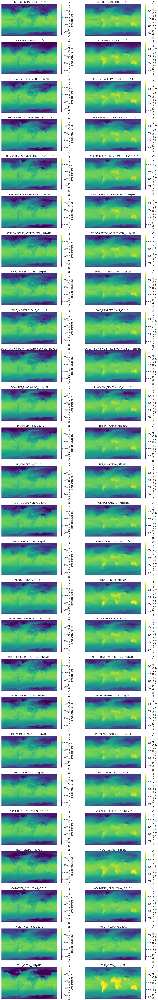

In [22]:
fig, axes = plt.subplots(figsize=(20,5*(data.cube_member_id.size)), ncols=2, nrows=(data.cube_member_id.size))
axes = axes.flatten()

tas_min_mean = data["tasmin"].mean().values
tas_min_std = data["tasmin"].std().values
tas_min_vmin = tas_min_mean - 2*tas_min_std
tas_min_vmax = tas_min_mean + 2*tas_min_std

tas_max_mean = data["tasmax"].mean().values
tas_max_std = data["tasmax"].std().values
tas_max_vmin = tas_max_mean - 2*tas_max_std
tas_max_vmax = tas_max_mean + 2*tas_max_std

tas_max_vmin = tas_min_vmin
tas_min_vmax = tas_max_vmax


for im, m in enumerate(data.cube_member_id.values):
    data.isel(cube_member_id=im)["tasmin"].plot(ax=axes[2*im], vmin=tas_min_vmin, vmax=tas_min_vmax)
    data.isel(cube_member_id=im)["tasmax"].plot(ax=axes[2*im+1], vmin=tas_max_vmin, vmax=tas_max_vmax)
    axes[2*im].set_title(m)
    axes[2*im+1].set_title(m)
    axes[2*im].set_ylabel("")
    axes[2*im+1].set_ylabel("")
    axes[2*im].set_xlabel("")
    axes[2*im+1].set_xlabel("")
    axes[2*im].set_xticks([])
    axes[2*im+1].set_xticks([])
    axes[2*im].set_yticks([])
    axes[2*im+1].set_yticks([])

# Example of the combination of data from multiple scenario

Now the last exemple aims at combining multiple datacubes to produce a graph where we compare the temperature evolution of the different scenarios.
We keep working with monthly data and we will use the location of Raglan (New Zealand) for our example.

The graph produced here is inspired by the one produced as part of the latest IPCC report, however we use different data and we do not claim that the methodology used here calculate the anomalies is correct. Anomalies were calculated which respect to a 35 climatology derived from the ensemble mean of each model (source_id) separately. As mentionned earlier the datacubes only serve a subset of the existing CMIP6 model runs and hence the graph is squewed towards whatever data is available.

Each datacube has to be queries separately and we proceed by first querying the datacubes only to load their structure and dimensions and determine which source_id are common to all datacubes. Then, we redo the same query using an additional coordinate filter applied to the source_id field.

In [7]:
raglan_latitude = 37.8232
raglan_longitude = 174.8906

In [8]:
# Datacubes of interest
historical_datacube_id = 'cmip6_datacube_monthly_atmospheric_historical'
scenario_datacube_ids = ['cmip6_datacube_monthly_atmospheric_ssp126',
                         'cmip6_datacube_monthly_atmospheric_ssp245',
                         'cmip6_datacube_monthly_atmospheric_ssp370',
                         'cmip6_datacube_monthly_atmospheric_ssp585']


In [11]:
# Initial query for historical data
historical_data = datamesh.query({
        "datasource": historical_datacube_id,
        "parameters": {},
        "description": "Historical raglan temperature query",
        "variables": [
            "tas",
            "variable_available"
        ],
        "geofilter": {
            "type": "feature",
                    "geom": {
                        "type": "Feature",
                        "geometry": {
                            "type": "Point",
                            "coordinates": [raglan_longitude, raglan_latitude]
                        },
                    },
        },
        "timefilter": {
            "type": "range",
            "times": ["1980-01-01T00:00:00", None],
            "resolution": "native",
        }
        },
        use_dask=True)
# Time 12.9s

In [9]:
# Initial query for scenario data
scenario_data =\
    [datamesh.query({
        "datasource": datacube_id,
        "parameters": {},
        "description": "Test query",
        "variables": [
            "tas",
            "variable_available"
        ],
        "geofilter": {
            "type": "feature",
                    "geom": {
                        "type": "Feature",
                        "geometry": {
                            "type": "Point",
                            "coordinates": [raglan_longitude, raglan_latitude]
                        },
                    },
        }
        },
        use_dask=True)

        for datacube_id in scenario_datacube_ids
    ]
# Time 

In [15]:
scenario_datacube_ids

['cmip6_datacube_monthly_atmospheric_ssp126',
 'cmip6_datacube_monthly_atmospheric_ssp245',
 'cmip6_datacube_monthly_atmospheric_ssp370',
 'cmip6_datacube_monthly_atmospheric_ssp585']

In [27]:
# Identify common source ids
selected_source_id =\
    [source_id for source_id in historical_data.source_id.values if np.all([source_id in scenario_data[i].source_id.values for i in range(len(scenario_data))])]
selected_source_id

['BCC-CSM2-MR',
 'FGOALS-f3-L',
 'FGOALS-g3',
 'CanESM5',
 'ACCESS-CM2',
 'EC-Earth3',
 'EC-Earth3-Veg',
 'EC-Earth3-Veg-LR',
 'INM-CM5-0',
 'IPSL-CM6A-LR',
 'MIROC6',
 'MPI-ESM1-2-HR',
 'MPI-ESM1-2-LR',
 'MRI-ESM2-0',
 'GISS-E2-1-G',
 'CESM2',
 'GFDL-ESM4']

In [21]:
# Query for historical data with common source ids
historical_data = datamesh.query({
        "datasource": historical_datacube_id,
        "parameters": {},
        "description": "Historical raglan temperature query",
        "variables": [
            "tas",
            "variable_available"
        ],
        "geofilter": {
            "type": "feature",
                    "geom": {
                        "type": "Feature",
                        "geometry": {
                            "type": "Point",
                            "coordinates": [raglan_longitude, raglan_latitude]
                        },
                    },
        },
        "timefilter": {
            "type": "range",
            "times": ["1980-01-01T00:00:00", None],
            "resolution": "native",
        },
        "coordfilter": [{"coord": "source_id", "values": selected_source_id}],
        },
        use_dask=True)

In [10]:
# Query for scenario data with common source ids
scenario_data =\
    [datamesh.query({
        "datasource": datacube_id,
        "parameters": {},
        "description": "Test query",
        "variables": [
            "tas",
            "variable_available"
        ],
        "geofilter": {
            "type": "feature",
                    "geom": {
                        "type": "Feature",
                        "geometry": {
                            "type": "Point",
                            "coordinates": [raglan_longitude, raglan_latitude]
                        },
                    },
        }
        },
        use_dask=True)

        for datacube_id in scenario_datacube_ids
    ]

Now we calculate the anomalies for each scenario and for the historical data with respect to a climatology derived for each source from the historical data.

In [24]:
historical_anomaly =\
    xr.concat([historical_data.tas.isel(cube_member_id=(historical_data.source_id.values==source_id)).groupby('time.month')
               -historical_data.tas.isel(cube_member_id=(historical_data.source_id.values==source_id)).groupby('time.month').mean(dim='time')
               for source_id in np.unique(historical_data.source_id.values)],
              dim='cube_member_id')


In [57]:
scenario_anomaly =\
    [ xr.concat([scenario_data[i].tas.isel(cube_member_id=(scenario_data[i].source_id.values==source_id)).groupby('time.month')
                 -historical_data.tas.isel(cube_member_id=(historical_data.source_id.values==source_id)).groupby('time.month').mean(dim='time')
                 for source_id in scenario_data[i].source_id.values
                 if source_id in historical_data.source_id.values],
                dim='cube_member_id')
     for i in range(len(scenario_datacube_ids))]

The final plot is quite noisy because this is data interpolated to a single point but the idea is there.

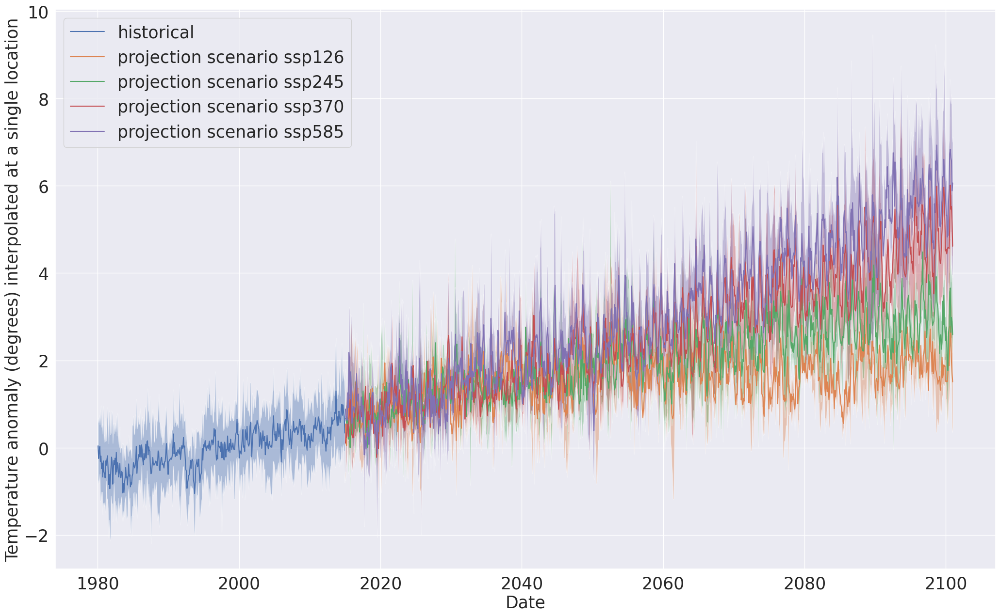

In [72]:
plt.figure(figsize=(25,15))

plt.plot(historical_anomaly.time,
         historical_anomaly.mean(dim='cube_member_id'),
         label='historical')
plt.fill_between(historical_anomaly.time,
                 historical_anomaly.quantile(0.17,dim="cube_member_id"),
                 historical_anomaly.quantile(0.83, dim='cube_member_id'),
                 alpha=0.4)

for i, datacube_id in enumerate(scenario_datacube_ids):
    plt.plot(scenario_anomaly[i].time,
             scenario_anomaly[i].mean(dim='cube_member_id'),
             label="projection scenario "+datacube_id.split("_")[-1])
    plt.fill_between(scenario_anomaly[i].time,
                     scenario_anomaly[i].quantile(0.17,dim="cube_member_id"),
                     scenario_anomaly[i].quantile(0.83, dim='cube_member_id'),
                     alpha=0.4)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel("Date", fontsize=25)
plt.ylabel("Temperature anomaly (degrees) interpolated at a single location", fontsize=25)
plt.legend(fontsize=25)
plt.savefig("/home/sebastien/Pictures/raglan_temperature_anomaly.png")